# General Flow of Notebook

- **Data Extraction for Forest Fires**: 
  - Utilized the Reader library for wildfire data extraction.
  - Calculated the shortest distance to the fire periphery for accurate distance measurement.

- **Data Extraction for AQI**:
  - Focused on PM2.5 data, as it is the primary contributor to air quality degradation from wildfire smoke.
  - Data available for AQI spans from 1999 to 2021.

- **Data Filtering**:
  - Applied filters based on the year (1961-2021), the fire season (May to October), and the 650-mile proximity criterion from Charleston.

- **Smoke Estimate Calculation**:
  - Calculated smoke impact as `fire size in acres / log(1 + fire distance)`.
  - Used logarithmic scaling to emphasize greater impact from nearby fires while gradually reducing the impact of distant fires.

- **Prediction Model**:
  - Implemented an ARIMA model (differencing once) to make the dataset stationary for predictions.
  - The model forecasts smoke impact for the years 2025 to 2050.

- **Correlation Analysis**:
  - Calculated the correlation between AQI and smoke estimates, resulting in a correlation coefficient of 0.35.
  - This positive correlation suggests that as AQI increases, the smoke estimate also increases, indicating both contribute to deteriorating air quality.

- **Visualizations**:
  - Created required visualizations as per Step 2, including histograms and time series graphs to illustrate patterns and trends.


# Data Extraction - Forest Fires using Reader library provided by Professor
 - City assigned to me is Charleston
 - I used the function "shortest_distance_from_place_to_fire_perimeter" to estimate the distance to my City since I feel this is more appropriate for this use case rather than using the avergae centroid

In [161]:
#
#    IMPORTS
# 

#    Import some standard python modules
import os, json, time
#
#    The module pyproj is a standard module that can be installed using pip or your other favorite
#    installation tool. This module provides tools to convert between different geodesic coordinate systems
#    and for calculating distances between points (coordinates) in a specific geodesic system.
#
from pyproj import Transformer, Geod
#
#    The 'wildfire' module is a user module. This module is available from the course website. The module
#    includes one object, a Reader, that can be used to read the GeoJSON files associated with the
#    wildefire dataset. The module also contains a sample datafile that is GeoJSON compliant and that
#    contains a small number of wildfires extracted from the main wildfire dataset.
#    
from wildfire.Reader import Reader as WFReader
#
#    There is a GeoJSON reader that you might try if you wanted to read the data. It has its own quirks.
#    There will be an example below that reads the sample file "Wildfire_short_sample.json"
#    
import geojson
#

In [162]:
#
#    CONSTANTS
#

#
#    The 'Wildfire_short_sample_2024.json' is an extraction from the full 'USGS_Wildland_Fire_Combined_Dataset.json'
#    dataset extracting several major wildfires in California, plus a couple others that have interested data structure
#    features. 
#
#    The sample file includes data for 15 fires, mostly oriented around the uniqueness of the name. Naming conventions
#    for wildfires is really adhoc, which makes finding any named fire in the dataset a disambiguation mess. The named
#    fires were selected from https://en.wikipedia.org/wiki/List_of_California_wildfires
#
#    The point nof the sample is to provide something small to test with before committing to processing the, much 
#    larger, full dataset.
#
EXTRACT_FILENAME = "USGS_Wildland_Fire_Combined_Dataset.json"
#
#    The user module 'wildfire' contains a Reader object and the sample data. This bit of code finds where that is
#    located on your machine and constructs a path so that the sample data can be loaded. This assumes you have set 
#    a PYTHONPATH environment variable to point to the location on your machine where you store python user modules.
#
#    NOTE: if you use Anaconda for virtual python environments, Anaconda will adhere to the PYTHONPATH conventions
#    for user modules.
#
MODULENAME = "wildfire"
MODULEPATH = ""
try:
    ppath = os.environ.get('PYTHONPATH')
    if not ppath: raise
    MODULEPATH = os.path.join(ppath,MODULENAME)
except:
    # Likely here because a PYTHONPATH was not set, show a warning message
    print("Looks like you're not using a 'PYTHONPATH' to specify the location of your python user modules.")
    print("You may have to modify the sample code in this notebook to get the documented behaviors.")
    MODULEPATH = ""

if MODULEPATH:
    SAMPLE_DATA_FILENAME = os.path.join(MODULEPATH,EXTRACT_FILENAME)
else:
    SAMPLE_DATA_FILENAME = EXTRACT_FILENAME
#
# print out where we think we're going to find the sample data
print(f"{SAMPLE_DATA_FILENAME=}")

#
#    A dictionary of some city locations from the US west coast states.
#
CITY_LOCATIONS = {
    'charleston' :     {'city'   : 'Charleston',
                       'latlon' : [32.83, -79.97] }
}



Looks like you're not using a 'PYTHONPATH' to specify the location of your python user modules.
You may have to modify the sample code in this notebook to get the documented behaviors.
SAMPLE_DATA_FILENAME='USGS_Wildland_Fire_Combined_Dataset.json'


In [164]:
#
#    This bit of code opens a new wildfire reader, gets the header information and prints it to the screen
#
print(f"Attempting to open '{SAMPLE_DATA_FILENAME}' with wildfire.Reader() object")
wfreader = WFReader(SAMPLE_DATA_FILENAME)
print()
#
#    Now print the header - it contains some useful information
#
header_dict = wfreader.header()
header_keys = list(header_dict.keys())
print("The header has the following keys:")
#print(gj_keys)
print()
print("Header Dictionary")
print(json.dumps(header_dict,indent=4))


Attempting to open 'USGS_Wildland_Fire_Combined_Dataset.json' with wildfire.Reader() object

The header has the following keys:

Header Dictionary
{
    "displayFieldName": "",
    "fieldAliases": {
        "OBJECTID": "OBJECTID",
        "USGS_Assigned_ID": "USGS Assigned ID",
        "Assigned_Fire_Type": "Assigned Fire Type",
        "Fire_Year": "Fire Year",
        "Fire_Polygon_Tier": "Fire Polygon Tier",
        "Fire_Attribute_Tiers": "Fire Attribute Tiers",
        "GIS_Acres": "GIS_Acres",
        "GIS_Hectares": "GIS_Hectares",
        "Source_Datasets": "Source Datasets",
        "Listed_Fire_Types": "Listed Fire Types",
        "Listed_Fire_Names": "Listed Fire Names",
        "Listed_Fire_Codes": "Listed Fire Codes",
        "Listed_Fire_IDs": "Listed Fire IDs",
        "Listed_Fire_IRWIN_IDs": "Listed Fire IRWIN IDs",
        "Listed_Fire_Dates": "Listed Fire Dates",
        "Listed_Fire_Causes": "Listed Fire Causes",
        "Listed_Fire_Cause_Class": "Listed Fire Cause

In [165]:
feature_list = []
feature_count = 0

# Rewind to ensure we're starting at the beginning of the feature list
wfreader.rewind()

# Read through each feature, appending it to feature_list
feature = wfreader.next()
while feature:
    feature_list.append(feature)
    feature_count += 1
    # Uncomment the next line to track progress for very large datasets
    # if (feature_count % 100) == 0:
    #     print(f"Loaded {feature_count} features")
    
    # Proceed to the next feature
    feature = wfreader.next()

# Print the total number of features loaded
print(f"Loaded a total of {feature_count} features")
print(f"Variable 'feature_list' contains {len(feature_list)} features")

Loaded a total of 135061 features
Variable 'feature_list' contains 135061 features


There are a total of 135061 features which the code extracted.

In [168]:
#
#    The 'feature_list' variable was created when we read the sample file in a code cell above
#    Now, we're just going to look at one single feature - see what is in there
#
SLOT = 0
wf_feature = feature_list[SLOT]

# Print everyting in this dictionary (i.e., wf_feature) - it's long
print(f"The wildfire feature from slot '{SLOT}' of the loaded 'feature_list'")
print(json.dumps(wf_feature, indent=4))


The wildfire feature from slot '0' of the loaded 'feature_list'
{
    "attributes": {
        "OBJECTID": 1,
        "USGS_Assigned_ID": 1,
        "Assigned_Fire_Type": "Wildfire",
        "Fire_Year": 1860,
        "Fire_Polygon_Tier": 1,
        "Fire_Attribute_Tiers": "1 (1)",
        "GIS_Acres": 3940.20708940724,
        "GIS_Hectares": 1594.5452365353703,
        "Source_Datasets": "Comb_National_NIFC_Interagency_Fire_Perimeter_History (1)",
        "Listed_Fire_Types": "Wildfire (1)",
        "Listed_Fire_Names": "Big Quilcene River (1)",
        "Listed_Fire_Codes": "No code provided (1)",
        "Listed_Fire_IDs": "",
        "Listed_Fire_IRWIN_IDs": "",
        "Listed_Fire_Dates": "Listed Other Fire Date(s): 2006-11-02 - NIFC DATE_CUR field (1)",
        "Listed_Fire_Causes": "",
        "Listed_Fire_Cause_Class": "Undetermined (1)",
        "Listed_Rx_Reported_Acres": null,
        "Listed_Map_Digitize_Methods": "Other (1)",
        "Listed_Notes": "",
        "Processing

In [169]:
#
#    Every feature has a 'geometry' which specifies geo coordinates that make up each geographic thing
#    In the case of the wildfire data, most wildfires are bounded shapes, circles, squares, etc. This is
#    represented by shapes called 'rings' in GeoJSON.
# 
# Get the geometry for the feature we pulled from the feature_list
wf_geometry = wf_feature['geometry']
# The largest shape (ring) is supposed to be item zero in the list of 'rings'
wf_bigest_ring = wf_geometry['rings'][0]

print(f"The largest ring of wf_feature['features'][{SLOT}]['rings'] consists of {len(wf_bigest_ring)} points.")

The largest ring of wf_feature['features'][0]['rings'] consists of 768 points.


In [170]:
#
#    Transform feature geometry data
#
#    The function takes one parameter, a list of ESRI:102008 coordinates that will be transformed to EPSG:4326
#    The function returns a list of coordinates in EPSG:4326
def convert_ring_to_epsg4326(ring_data=None):
    converted_ring = list()
    #
    # We use a pyproj transformer that converts from ESRI:102008 to EPSG:4326 to transform the list of coordinates
    to_epsg4326 = Transformer.from_crs("ESRI:102008","EPSG:4326")
    # We'll run through the list transforming each ESRI:102008 x,y coordinate into a decimal degree lat,lon
    for coord in ring_data:
        lat,lon = to_epsg4326.transform(coord[0],coord[1])
        new_coord = lat,lon
        converted_ring.append(new_coord)
    return converted_ring

In [171]:
#
#   Convert one ring from the default to EPSG
#
#   There are two options here - depending upon whether you loaded data useing GeoJSON or the wildfire.Reader
#
#ring_in_epsg4326 = convert_ring_to_epsg4326(gj_bigest_ring)
#
ring_in_epsg4326 = convert_ring_to_epsg4326(wf_bigest_ring)
#
print(f"Ring consists of {len(ring_in_epsg4326)} points.")
#
#    If you want to print them out you can see what they look like converted.
#print(ring_in_epsg4326)
#for point in ring_in_epsg4326:
#    print(f"{point[0]},{point[1]}")


Ring consists of 768 points.


In [172]:
#    
#    The function takes two parameters
#        A place - which is coordinate point (list or tuple with two items, (lat,lon) in decimal degrees EPSG:4326
#        Ring_data - a list of decimal degree coordinates for the fire boundary
#
#    The function returns a list containing the shortest distance to the perimeter and the point where that is
#
def shortest_distance_from_place_to_fire_perimeter(place=None,ring_data=None):
    # convert the ring data to the right coordinate system
    ring = convert_ring_to_epsg4326(ring_data)    
    # create a epsg4326 compliant object - which is what the WGS84 ellipsoid is
    geodcalc = Geod(ellps='WGS84')
    closest_point = list()
    # run through each point in the converted ring data
    for point in ring:
        # calculate the distance
        d = geodcalc.inv(place[1],place[0],point[1],point[0])
        # convert the distance to miles
        distance_in_miles = d[2]*0.00062137
        # if it's closer to the city than the point we have, save it
        if not closest_point:
            closest_point.append(distance_in_miles)
            closest_point.append(point)
        elif closest_point and closest_point[0]>distance_in_miles:
            closest_point = list()
            closest_point.append(distance_in_miles)
            closest_point.append(point)
    return closest_point



#    
#    The function takes two parameters
#        A place - which is coordinate point (list or tuple with two items, (lat,lon) in decimal degrees EPSG:4326
#        Ring_data - a list of decimal degree coordinates for the fire boundary
#
#    The function returns the average miles from boundary to the place
#
def average_distance_from_place_to_fire_perimeter(place=None,ring_data=None):
    # convert the ring data to the right coordinate system
    ring = convert_ring_to_epsg4326(ring_data)    
    # create a epsg4326 compliant object - which is what the WGS84 ellipsoid is
    geodcalc = Geod(ellps='WGS84')
    # create a list to store our results
    distances_in_meters = list()
    # run through each point in the converted ring data
    for point in ring:
        # calculate the distance
        d = geodcalc.inv(place[1],place[0],point[1],point[0])
        distances_in_meters.append(d[2])
    #print("Got the following list:",distances_in_meters)
    # convert meters to miles
    distances_in_miles = [meters*0.00062137 for meters in distances_in_meters]
    # the esri polygon shape (the ring) requires that the first and last coordinates be identical to 'close the region
    # we remove one of them so that we don't bias our average by having two of the same point
    distances_in_miles_no_dup = distances_in_miles[1:]
    # now, average miles
    average = sum(distances_in_miles_no_dup)/len(distances_in_miles_no_dup)
    return average



Below we are storing distance of each fire to Charleton in a list and we will convert it to a dataframe later.

In [175]:
place = CITY_LOCATIONS["charleston"]
#fires_within_650_miles = []  # List to store fires within 650 miles
all_fires = []  # List to store all fires
exceptions_list = []  # List to store entries with exceptions

for wf_feature in feature_list:
    wf_year = wf_feature['attributes']['Fire_Year']
    wf_name = wf_feature['attributes']['Listed_Fire_Names'].split(',')[0]
    wf_size = wf_feature['attributes']['GIS_Acres']
    wf_type = wf_feature['attributes']['Assigned_Fire_Type']
    
    try:
        # Extract the ring data
        if 'rings' in wf_feature['geometry']:
            ring_data = wf_feature['geometry']['rings'][0]
        elif 'curveRings' in wf_feature['geometry']:
            ring_data = wf_feature['geometry']['curveRings'][0]
        else:
            raise KeyError("No compatible geometry in this fire data.")
        
        # Calculate the shortest distance
        distance = shortest_distance_from_place_to_fire_perimeter(place['latlon'], ring_data)

        # Store all fires information without any distance check
        all_fires.append({
            "fire_name": wf_name,
            "fire_size": wf_size,
            "fire_year": wf_year,
            "distance_miles": distance[0],
            "closest_point_latlon": distance[1],
            "city": place['city']
        })

        
    
    except KeyError as e:
        print(f"KeyError for fire '{wf_name}' ({wf_year}): {e}")
        exceptions_list.append({
            "fire_name": wf_name,
            "fire_size": wf_size,
            "fire_year": wf_year,
            "error": "KeyError",
            "message": str(e)
        })
    except Exception as e:
        # General exception to catch any other issues
        print(f"Error processing fire '{wf_name}' ({wf_year}): {e}")
        exceptions_list.append({
            "fire_name": wf_name,
            "fire_size": wf_size,
            "fire_year": wf_year,
            "error": type(e).__name__,
            "message": str(e)
        })

KeyError for fire 'BARNES SOUTH UNDERBURN - BARNES SOUTH  UNDERBURN (1)' (2007): 0
KeyError for fire 'BOYD JOHNSON (1)' (2007): 0
KeyError for fire 'VIRGINIAS (3)' (2008): 0
KeyError for fire 'GEORGE BRAND (1)' (2008): 0
KeyError for fire 'VIRGINIAS (2)' (2009): 0
KeyError for fire 'JAMIE JORDON (1)' (2009): 0
KeyError for fire 'JIM TIMBERLAKE (1)' (2009): 0
KeyError for fire 'No Fire Name Provided (1)' (2010): 0
KeyError for fire 'WILLIAM GHOLSTON (1)' (2010): 0
KeyError for fire 'JOHN HUTCHESON (1)' (2010): 0
KeyError for fire 'JEAN DODSON (1)' (2010): 0
KeyError for fire 'KEITH O'DANIEL (1)' (2010): 0
KeyError for fire 'MICHAEL CROWE (1)' (2010): 0
KeyError for fire 'JEANETTE WALKER (1)' (2010): 0
KeyError for fire 'No Fire Name Provided (2)' (2012): 0
KeyError for fire 'No Fire Name Provided (1)' (2012): 0
KeyError for fire 'Little Bald Hills - Williams Ridge Rx (2)' (2012): 0
KeyError for fire 'BALANCE UNDERBURN UNIT 2-1 (1)' (2013): 0
KeyError for fire 'MYRTLE BB WUI FY 15 (1)' (

Saving it as a csv in case kernel stops working and i may have to re reun the script.

In [432]:
import csv
# Specify the file path
output_file = "all_fires.csv"

# Extract the keys from the first dictionary for CSV header
keys = all_fires[0].keys()

# Write the data to a CSV file
with open(output_file, "w", newline="") as csvfile:
    dict_writer = csv.DictWriter(csvfile, fieldnames=keys)
    dict_writer.writeheader()
    dict_writer.writerows(all_fires)

print(f"Data saved to {output_file}")

Data saved to all_fires.csv


Getting fires within a distance of 650 miles as per the problem statement.

In [ ]:
place = CITY_LOCATIONS["charleston"]
fires_within_650_miles = []  # List to store fires within 650 miles
exceptions_list = []  # List to store entries with exceptions

for wf_feature in feature_list:
    wf_year = wf_feature['attributes']['Fire_Year']
    wf_name = wf_feature['attributes']['Listed_Fire_Names'].split(',')[0]
    wf_size = wf_feature['attributes']['GIS_Acres']
    wf_type = wf_feature['attributes']['Assigned_Fire_Type']
    
    try:
        # Extract the ring data
        if 'rings' in wf_feature['geometry']:
            ring_data = wf_feature['geometry']['rings'][0]
        elif 'curveRings' in wf_feature['geometry']:
            ring_data = wf_feature['geometry']['curveRings'][0]
        else:
            raise KeyError("No compatible geometry in this fire data.")
        
        # Calculate the shortest distance
        distance = shortest_distance_from_place_to_fire_perimeter(place['latlon'], ring_data)
        
        # Check if the distance is within 650 miles
        if distance[0] <= 650:
            # Store fires within 650 miles
            fires_within_650_miles.append({
                "fire_name": wf_name,
                "fire_size": wf_size,
                "fire_year": wf_year,
                "distance_miles": distance[0],
                "closest_point_latlon": distance[1],
                "city": place['city']
            })
            # Print information for fires within 650 miles
            print(f"The closest distance of fire '{wf_name}' ({wf_size:1.2f} acres) from {wf_year} was {distance[0]:1.2f} miles to {place['city']}")
            print(f"\tThe closest perimeter point lat,lon {distance[1][0]},{distance[1][1]}")
    
    except KeyError as e:
        print(f"KeyError for fire '{wf_name}' ({wf_year}): {e}")
        exceptions_list.append({
            "fire_name": wf_name,
            "fire_size": wf_size,
            "fire_year": wf_year,
            "error": "KeyError",
            "message": str(e)
        })
    except Exception as e:
        # General exception to catch any other issues
        print(f"Error processing fire '{wf_name}' ({wf_year}): {e}")
        exceptions_list.append({
            "fire_name": wf_name,
            "fire_size": wf_size,
            "fire_year": wf_year,
            "error": type(e).__name__,
            "message": str(e)
        })

The closest distance of fire 'Laurel Branch (14)' (498.89 acres) from 1920 was 284.08 miles to Charleston
	The closest perimeter point lat,lon 35.66241165344431,-83.57646729414687
The closest distance of fire 'Spruce Mountain (2)' (856.77 acres) from 1923 was 263.36 miles to Charleston
	The closest perimeter point lat,lon 35.604557191100525,-83.13321054784754
The closest distance of fire 'Goshen Ridge (16)' (5870.44 acres) from 1925 was 280.04 miles to Charleston
	The closest perimeter point lat,lon 35.600631255252914,-83.54819511037965
The closest distance of fire 'Balsam/Cat (12)' (8709.39 acres) from 1925 was 266.34 miles to Charleston
	The closest perimeter point lat,lon 35.66029585154874,-83.1388207335046
The closest distance of fire 'Dome (2)' (2272.10 acres) from 1925 was 275.15 miles to Charleston
	The closest perimeter point lat,lon 35.53663297003917,-83.50165007385787
The closest distance of fire 'Mount Ambler (8)' (1194.51 acres) from 1925 was 272.90 miles to Charleston
	The

Saving it as a csv in case kernel stops working and i may have to re reun the script.

In [32]:
import csv
# Specify the file path
output_file = "fires_within_650_miles.csv"

# Extract the keys from the first dictionary for CSV header
keys = fires_within_650_miles[0].keys()

# Write the data to a CSV file
with open(output_file, "w", newline="") as csvfile:
    dict_writer = csv.DictWriter(csvfile, fieldnames=keys)
    dict_writer.writeheader()
    dict_writer.writerows(fires_within_650_miles)

print(f"Data saved to {output_file}")

Data saved to fires_within_650_miles.csv


In [179]:
import pandas as pd # Loading dataframe from recently saved csv - the purpose it to check if file laoding is correct or not.
df = pd.read_csv('fires_within_650_miles.csv')

In [180]:
other_items =[] # list to store other features

In [181]:
for i in range(len(feature_list)):
    feature_add = {}
    
    fire_name = feature_list[i]['attributes'].get('Listed_Fire_Names') #fire names for joining to main datframes 
    fire_tier = feature_list[i]['attributes'].get('Fire_Polygon_Tier') #tier of fire
    fire_dates = feature_list[i]['attributes'].get('Listed_Fire_Dates') #dates of fire
    circleness_scale = feature_list[i]['attributes'].get('Circleness_Scale') #circlesness scale
    #use unknown if value is not present
    feature_add['fire_name'] = fire_name if fire_name is not None else "Unknown"
    feature_add['fire_tier'] = fire_tier if fire_tier is not None else "Unknown"
    feature_add['fire_dates'] = fire_dates if fire_dates is not None else "Unknown"
    feature_add['circleness_scale'] = circleness_scale if circleness_scale is not None else "Unknown"
    
    other_items.append(feature_add)

In [185]:
#convert the "other extracted data" to a dataframe
df_others = pd.DataFrame(other_items)


In [188]:
#split the fire dates into different catoegires based on discovery date, out date, start date and ignition date
df_others['discovery_date'] = df_others['fire_dates'].str.extract(r'(Listed Wildfire Discovery Date\(s\):\s[\d-]+\s\(\d+\))')
df_others['out_date'] = df_others['fire_dates'].str.extract(r'(Listed Wildfire Out Date\(s\):\s[\d-]+\s\(\d+\))')
df_others['start_date'] = df_others['fire_dates'].str.extract(r'(Listed Prescribed Fire Start Date\(s\):\s[\d-]+\s\(\d+\))')
df_others['ignition_date'] = df_others['fire_dates'].str.extract(r'(Listed Ignition Date\(s\):\s[\d-]+\s\(\d+\))')


In [190]:
#reate function to exract date from a string using regex
import re #importing the regex library
def extract_date_from_string(text):
    try:
        # Check if the input is NaN and return NaN
        if pd.isna(text):
            return pd.NA  # or np.nan, depending on your preference
        
        # Regular expression to match the date in the format YYYY-MM-DD
        match = re.search(r'\d{4}-\d{2}-\d{2}', text)
        
        if match:
            return match.group(0)  # Return the matched date
        return None  # Return None if no date is found
    except Exception as e:
        print(f"Unexpected error: {e} - {text}")
        return None

In [192]:
#apply the above function to get dates
df_others['discovery_date'] = df_others['discovery_date'].apply(extract_date_from_string)
df_others['out_date'] = df_others['out_date'].apply(extract_date_from_string)
df_others['start_date'] = df_others['start_date'].apply(extract_date_from_string)
df_others['ignition_date'] = df_others['ignition_date'].apply(extract_date_from_string)

In [196]:
#merge othe features to main dataframe
df_fires = pd.merge(df, df_others, on= 'fire_name', how = 'inner')

In [197]:
len(df_fires)

18311933

In [198]:
#convert to csv to save in case kernel stops working
df_fires.to_csv('df_fires.csv')

# Extracting AQI data - Using Professors Code
- Since PM 2.5 plays a major role in air quality and smoke, data pertaining to that is used for the assignments analysis

In [45]:
# 
#    These are standard python modules
#
#import json, time, urllib.parse
import json, time
#
#    The 'requests' module is a distribution module for making web requests. If you do not have it already, you'll need to install it
import requests

In [46]:
#########
#
#    CONSTANTS
#

#
#    This is the root of all AQS API URLs
#
API_REQUEST_URL = 'https://aqs.epa.gov/data/api'

#
#    These are some of the 'actions' we can ask the API to take or requests that we can make of the API
#
#    Sign-up request - generally only performed once - unless you lose your key
API_ACTION_SIGNUP = '/signup?email={email}'
#
#    List actions provide information on API parameter values that are required by some other actions/requests
API_ACTION_LIST_CLASSES = '/list/classes?email={email}&key={key}'
API_ACTION_LIST_PARAMS = '/list/parametersByClass?email={email}&key={key}&pc={pclass}'
API_ACTION_LIST_SITES = '/list/sitesByCounty?email={email}&key={key}&state={state}&county={county}'
#
#    Monitor actions are requests for monitoring stations that meet specific criteria
API_ACTION_MONITORS_COUNTY = '/monitors/byCounty?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&state={state}&county={county}'
API_ACTION_MONITORS_BOX = '/monitors/byBox?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&minlat={minlat}&maxlat={maxlat}&minlon={minlon}&maxlon={maxlon}'
#
#    Summary actions are requests for summary data. These are for daily summaries
API_ACTION_DAILY_SUMMARY_COUNTY = '/dailyData/byCounty?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&state={state}&county={county}'
API_ACTION_DAILY_SUMMARY_BOX = '/dailyData/byBox?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&minlat={minlat}&maxlat={maxlat}&minlon={minlon}&maxlon={maxlon}'
#
#    It is always nice to be respectful of a free data resource.
#    We're going to observe a 100 requests per minute limit - which is fairly nice
API_LATENCY_ASSUMED = 0.002       # Assuming roughly 2ms latency on the API and network
API_THROTTLE_WAIT = (1.0/100.0)-API_LATENCY_ASSUMED
#
#
#    This is a template that covers most of the parameters for the actions we might take, from the set of actions
#    above. In the examples below, most of the time parameters can either be supplied as individual values to a
#    function - or they can be set in a copy of the template and passed in with the template.
# 
AQS_REQUEST_TEMPLATE = {
    "email":      "",     
    "key":        "",      
    "state":      "",     # the two digit state FIPS # as a string
    "county":     "",     # the three digit county FIPS # as a string
    "begin_date": "",     # the start of a time window in YYYYMMDD format
    "end_date":   "",     # the end of a time window in YYYYMMDD format, begin_date and end_date must be in the same year
    "minlat":    0.0,
    "maxlat":    0.0,
    "minlon":    0.0,
    "maxlon":    0.0,
    "param":     "",     # a list of comma separated 5 digit codes, max 5 codes requested
    "pclass":    ""      # parameter class is only used by the List calls
}



In [79]:
#
#    This implements the sign-up request. The parameters are standardized so that this function definition matches
#    all of the others. However, the easiest way to call this is to simply call this function with your preferred
#    email address.
#
def request_signup(email_address = 'anurag96@uw.edu',
                   endpoint_url = API_REQUEST_URL, 
                   endpoint_action = API_ACTION_SIGNUP, 
                   request_template = AQS_REQUEST_TEMPLATE,
                   headers = None):
    
    # Make sure we have a string - if you don't have access to this email addres, things might go badly for you
    if email_address:
        request_template['email'] = email_address        
    
    if not request_template['email']: 
        raise Exception("Must supply an email address to call 'request_signup()'")

    if '@' not in request_template['email']: 
        raise Exception(f"Must supply an email address to call 'request_signup()'. The string '{request_template['email']}' does not look like an email address.")

    # Compose the signup url - create a request URL by combining the endpoint_url with the parameters for the request
    request_url = endpoint_url+endpoint_action.format(**request_template)
        
    # make the request
    try:
        # Wait first, to make sure we don't exceed a rate limit in the situation where an exception occurs
        # during the request processing - throttling is always a good practice with a free data source
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response




In [80]:
#
#    A SIGNUP request is only to be done once, to request a key. A key is sent to that email address and needs to be confirmed with a click through
#    This code should probably be commented out after you've made your key request to make sure you don't accidentally make a new sign-up request
#
print("Requesting SIGNUP ...")
USERNAME = "anurag96@uw.edu"
response = request_signup(USERNAME)
print(json.dumps(response,indent=4))
#

Requesting SIGNUP ...
{
    "Header": [
        {
            "status": "Success",
            "request_time": "2024-10-28T02:11:51-04:00",
            "url": "https://aqs.epa.gov/data/api/signup?email=anurag96@uw.edu"
        }
    ],
    "Data": [
        "You should receive an email containing your new key shortly."
    ]
}


In [47]:
#
#   Once we have the signup email, we can define two constants:
#
#   USERNAME - This should be the email address you sent the EPA asking for access to the API during sign-up
#   APIKEY   - This should be the authorization key they sent you
#
#   In this case I don't want to distribute my keys with the source of the notebook, so I wrote a key manager object that
#   helps track all of my API keys - a username and domain name retrieves the key. The key manager hides the keys on disk
#   separate from the code. Another common approach is to store your API key as an OS environment variable. You then use
#   a python package to extract that API key from the specific environment variable.
#
#from apikeys.KeyManager import KeyManager
#keyman = KeyManager()
#
#   Naturally, you should probably use the USERNAME that you used when you requested the API Key. I've used my email
#   address as my USERNAME when I added the API Key to the Key manager. This will look it up for me.
#USERNAME = "dwmc@uw.edu"
#key_info = keyman.findRecord(USERNAME,API_REQUEST_URL)
#APIKEY = key_info[0]['key']
#print(key_info[0]['description'])
#print(APIKEY)
#
#   Note: if you don't want to use the key manager to help manage your API keys, you can specify the values as constants
#   below. Just don't distribute the notebook without removing the constants or you'll be distributing your key too.
#
USERNAME = "anurag96@uw.edu"
APIKEY = "bluegazelle71"


In [49]:
#
#    This implements the list request. There are several versions of the list request that only require email and key.
#    This code sets the default action/requests to list the groups or parameter class descriptors. Having those descriptors 
#    allows one to request the individual (proprietary) 5 digit codes for individual air quality measures by using the
#    param request. Some code in later cells will illustrate those requests.
#
def request_list_info(email_address = None, key = None,
                      endpoint_url = API_REQUEST_URL, 
                      endpoint_action = API_ACTION_LIST_CLASSES, 
                      request_template = AQS_REQUEST_TEMPLATE,
                      headers = None):
    
    #  Make sure we have email and key - at least
    #  This prioritizes the info from the call parameters - not what's already in the template
    if email_address:
        request_template['email'] = email_address
    if key:
        request_template['key'] = key
    
    # For the basic request we need an email address and a key
    if not request_template['email']:
        raise Exception("Must supply an email address to call 'request_list_info()'")
    if not request_template['key']: 
        raise Exception("Must supply a key to call 'request_list_info()'")

    # compose the request
    request_url = endpoint_url+endpoint_action.format(**request_template)
        
    # make the request
    try:
        # Wait first, to make sure we don't exceed a rate limit in the situation where an exception occurs
        # during the request processing - throttling is always a good practice with a free data source
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response



In [50]:
#
#   The default should get us a list of the various groups or classes of sensors. These classes are user defined names for clustors of
#   sensors that might be part of a package or default air quality sensing station. We need a class name to start getting down to the
#   a sensor ID. Each sensor type has an ID number. We'll eventually need those ID numbers to be able to request values that come from
#   that specific sensor.
#
request_data = AQS_REQUEST_TEMPLATE.copy()
request_data['email'] = USERNAME
request_data['key'] = APIKEY

response = request_list_info(request_template=request_data)

if response["Header"][0]['status'] == "Success":
    print(json.dumps(response['Data'],indent=4))
else:
    print(json.dumps(response,indent=4))


[
    {
        "code": "AIRNOW MAPS",
        "value_represented": "The parameters represented on AirNow maps (88101, 88502, and 44201)"
    },
    {
        "code": "ALL",
        "value_represented": "Select all Parameters Available"
    },
    {
        "code": "AQI POLLUTANTS",
        "value_represented": "Pollutants that have an AQI Defined"
    },
    {
        "code": "CORE_HAPS",
        "value_represented": "Urban Air Toxic Pollutants"
    },
    {
        "code": "CRITERIA",
        "value_represented": "Criteria Pollutants"
    },
    {
        "code": "CSN DART",
        "value_represented": "List of CSN speciation parameters to populate the STI DART tool"
    },
    {
        "code": "FORECAST",
        "value_represented": "Parameters routinely extracted by AirNow (STI)"
    },
    {
        "code": "HAPS",
        "value_represented": "Hazardous Air Pollutants"
    },
    {
        "code": "IMPROVE CARBON",
        "value_represented": "IMPROVE Carbon Parameters"
    }

In [51]:
#
#   Once we have a list of the classes or groups of possible sensors, we can find the sensor IDs that make up that class (group)
#   The one that looks to be associated with the Air Quality Index is "AQI POLLUTANTS"
#   We'll use that to make another list request.
#
AQI_PARAM_CLASS = "AQI POLLUTANTS"


In [52]:
#
#   Structure a request to get the sensor IDs associated with the AQI
#
request_data = AQS_REQUEST_TEMPLATE.copy()
request_data['email'] = USERNAME
request_data['key'] = APIKEY
request_data['pclass'] = AQI_PARAM_CLASS  # here we specify that we want this 'pclass' or parameter classs

response = request_list_info(request_template=request_data, endpoint_action=API_ACTION_LIST_PARAMS)

if response["Header"][0]['status'] == "Success":
    print(json.dumps(response['Data'],indent=4))
else:
    print(json.dumps(response,indent=4))


[
    {
        "code": "42101",
        "value_represented": "Carbon monoxide"
    },
    {
        "code": "42401",
        "value_represented": "Sulfur dioxide"
    },
    {
        "code": "42602",
        "value_represented": "Nitrogen dioxide (NO2)"
    },
    {
        "code": "44201",
        "value_represented": "Ozone"
    },
    {
        "code": "81102",
        "value_represented": "PM10 Total 0-10um STP"
    },
    {
        "code": "88101",
        "value_represented": "PM2.5 - Local Conditions"
    },
    {
        "code": "88502",
        "value_represented": "Acceptable PM2.5 AQI & Speciation Mass"
    }
]


We are only extracting the data corresponding to pM2.5 since it is the major contributor to smoke/air quality degradation and also it saves time.

In [53]:
#
#   Given the set of sensor codes, now we can create a parameter list or 'param' value as defined by the AQS API spec.
#   It turns out that we want all of these measures for AQI, but we need to have two different param constants to get
#   all seven of the code types. We can only have a max of 5 sensors/values request per param.
#
#   Gaseous AQI pollutants CO, SO2, NO2, and O2
#AQI_PARAMS_GASEOUS = "42101,42401,42602,44201"
#
#   Particulate AQI pollutants PM10, PM2.5, and Acceptable PM2.5
AQI_PARAMS_PARTICULATES = "88101"
#   
#

In [54]:

#Charleston city location
CITY_LOCATIONS = {
    'charleston' :       {'city'   : 'Charleston city',
                       'county' : 'Charleston County',
                       'state'  : 'South Carolina',
                       'fips'   : '45019',
                       'latlon' : [32.83, -79.97] } 
}


In [55]:
#
#  This list request should give us a list of all the monitoring stations in the county specified by the
#  given city selected from the CITY_LOCATIONS dictionary
#
request_data = AQS_REQUEST_TEMPLATE.copy()
request_data['email'] = USERNAME
request_data['key'] = APIKEY
request_data['state'] = CITY_LOCATIONS['charleston']['fips'][:2]   # the first two digits (characters) of FIPS is the state code
request_data['county'] = CITY_LOCATIONS['charleston']['fips'][2:]  # the last three digits (characters) of FIPS is the county code

response = request_list_info(request_template=request_data, endpoint_action=API_ACTION_LIST_SITES)

if response["Header"][0]['status'] == "Success":
    print(json.dumps(response['Data'],indent=4))
else:
    print(json.dumps(response,indent=4))


[
    {
        "code": "0001",
        "value_represented": "CHARLESTON COUNTY HEALTH DEPARTMENT"
    },
    {
        "code": "0002",
        "value_represented": "CARROL'S FISH MARKET (CHARLESTON)"
    },
    {
        "code": "0003",
        "value_represented": "JENKINS AVE. FIRE STATION"
    },
    {
        "code": "0004",
        "value_represented": "CHARLESTON COUNTY HOSPITAL"
    },
    {
        "code": "0005",
        "value_represented": "ASHE STREET"
    },
    {
        "code": "0006",
        "value_represented": "West Ashley"
    },
    {
        "code": "0007",
        "value_represented": "U. S. NAVAL BASE"
    },
    {
        "code": "0008",
        "value_represented": "Mount Pleasant"
    },
    {
        "code": "0009",
        "value_represented": "Rosemont"
    },
    {
        "code": "0010",
        "value_represented": "TRI COUNTY TECH ED CENTER"
    },
    {
        "code": "0013",
        "value_represented": "ST ANDREWS FIRE STATION #12"
    },
    {
  

In [56]:
#
#    This implements the daily summary request. Daily summary provides a daily summary value for each sensor being requested
#    from the start date to the end date. 
#
#    Like the two other functions, this can be called with a mixture of a defined parameter dictionary, or with function
#    parameters. If function parameters are provided, those take precedence over any parameters from the request template.
#
def request_daily_summary(email_address = None, key = None, param=None,
                          begin_date = None, end_date = None, fips = None,
                          endpoint_url = API_REQUEST_URL, 
                          endpoint_action = API_ACTION_DAILY_SUMMARY_COUNTY, 
                          request_template = AQS_REQUEST_TEMPLATE,
                          headers = None):
    
    #  This prioritizes the info from the call parameters - not what's already in the template
    if email_address:
        request_template['email'] = email_address
    if key:
        request_template['key'] = key
    if param:
        request_template['param'] = param
    if begin_date:
        request_template['begin_date'] = begin_date
    if end_date:
        request_template['end_date'] = end_date
    if fips and len(fips)==5:
        request_template['state'] = fips[:2]
        request_template['county'] = fips[2:]            

    # Make sure there are values that allow us to make a call - these are always required
    if not request_template['email']:
        raise Exception("Must supply an email address to call 'request_daily_summary()'")
    if not request_template['key']: 
        raise Exception("Must supply a key to call 'request_daily_summary()'")
    if not request_template['param']: 
        raise Exception("Must supply param values to call 'request_daily_summary()'")
    if not request_template['begin_date']: 
        raise Exception("Must supply a begin_date to call 'request_daily_summary()'")
    if not request_template['end_date']: 
        raise Exception("Must supply an end_date to call 'request_daily_summary()'")
    # Note we're not validating FIPS fields because not all of the daily summary actions require the FIPS numbers
        
    # compose the request
    request_url = endpoint_url+endpoint_action.format(**request_template)
        
    # make the request
    try:
        # Wait first, to make sure we don't exceed a rate limit in the situation where an exception occurs
        # during the request processing - throttling is always a good practice with a free data source
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response



In [57]:
#
#    This is a list of field names - data - that will be extracted from each record
#
EXTRACTION_FIELDS = ['sample_duration','observation_count','arithmetic_mean','aqi']

#
#    The function creates a summary record
def extract_summary_from_response(r=None, fields=EXTRACTION_FIELDS):
    ## the result will be structured around monitoring site, parameter, and then date
    result = dict()
    data = r["Data"]
    for record in data:
        # make sure the record is set up
        site = record['site_number']
        param = record['parameter_code']
        #date = record['date_local']    # this version keeps the respnse value YYYY-
        date = record['date_local'].replace('-','') # this puts it in YYYYMMDD format
        if site not in result:
            result[site] = dict()
            result[site]['local_site_name'] = record['local_site_name']
            result[site]['site_address'] = record['site_address']
            result[site]['state'] = record['state']
            result[site]['county'] = record['county']
            result[site]['city'] = record['city']
            result[site]['pollutant_type'] = dict()
        if param not in result[site]['pollutant_type']:
            result[site]['pollutant_type'][param] = dict()
            result[site]['pollutant_type'][param]['parameter_name'] = record['parameter']
            result[site]['pollutant_type'][param]['units_of_measure'] = record['units_of_measure']
            result[site]['pollutant_type'][param]['method'] = record['method']
            result[site]['pollutant_type'][param]['data'] = dict()
        if date not in result[site]['pollutant_type'][param]['data']:
            result[site]['pollutant_type'][param]['data'][date] = list()
        
        # now extract the specified fields
        extract = dict()
        for k in fields:
            if str(k) in record:
                extract[str(k)] = record[k]
            else:
                # this makes sure we always have the requested fields, even if
                # we have a missing value for a given day/month
                extract[str(k)] = None
        
        # add this extraction to the list for the day
        result[site]['pollutant_type'][param]['data'][date].append(extract)
    
    return result


In [59]:
request_data = AQS_REQUEST_TEMPLATE.copy()
request_data['email'] = USERNAME
request_data['key'] = APIKEY
request_data['param'] = AQI_PARAMS_PARTICULATES
request_data['state'] = CITY_LOCATIONS['charleston']['fips'][:2]
request_data['county'] = CITY_LOCATIONS['charleston']['fips'][2:]

In [60]:
# Initialize empty lists to store the summaries for each year
#gaseous_summaries = []
particulate_summaries = []

In [65]:
from tqdm import tqdm
for year in tqdm(range(1973, 2022), desc="Processing Years"): #looping through 1973 to 2021 since AQI data collection started from 1973
    # Update request dates for the current year between May 1st to Oct 31st
    begin_date = f"{year}0501"
    end_date = f"{year}1031"

    #gaseous_aqi = request_daily_summary(request_template=request_data, begin_date=begin_date, end_date=end_date)
   # print("Response for the gaseous pollutants ...")
    #
    #if gaseous_aqi["Header"][0]['status'] == "Success":
    #    print(json.dumps(gaseous_aqi['Data'], indent=4))
    #elif gaseous_aqi["Header"][0]['status'].startswith("No data "):
    #    print("Looks like the response generated no data. You might take a closer look at your request and the response data.")

    request_data['param'] = AQI_PARAMS_PARTICULATES
    particulate_aqi = request_daily_summary(request_template=request_data, begin_date=begin_date, end_date=end_date)
    print("Response for the particulate pollutants ...")
    #
    if particulate_aqi["Header"][0]['status'] == "Success":
        print(json.dumps(particulate_aqi['Data'], indent=4))
    elif particulate_aqi["Header"][0]['status'].startswith("No data "):
        print("Looks like the response generated no data. You might take a closer look at your request and the response data.")

    # Extract summaries
    #extract_gaseous = extract_summary_from_response(gaseous_aqi)
    #gaseous_summaries.append(extract_gaseous)

    extract_particulate = extract_summary_from_response(particulate_aqi)
    particulate_summaries.append(extract_particulate)

Processing Years:   2%|▌                         | 1/49 [00:00<00:18,  2.63it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:   4%|█                         | 2/49 [00:00<00:17,  2.74it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:   6%|█▌                        | 3/49 [00:01<00:16,  2.77it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:   8%|██                        | 4/49 [00:01<00:16,  2.79it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  10%|██▋                       | 5/49 [00:01<00:16,  2.75it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  12%|███▏                      | 6/49 [00:02<00:15,  2.78it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  14%|███▋                      | 7/49 [00:02<00:15,  2.76it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  16%|████▏                     | 8/49 [00:02<00:14,  2.78it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  18%|████▊                     | 9/49 [00:03<00:14,  2.78it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  20%|█████                    | 10/49 [00:03<00:13,  2.80it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  22%|█████▌                   | 11/49 [00:03<00:13,  2.81it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  24%|██████                   | 12/49 [00:04<00:13,  2.81it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  27%|██████▋                  | 13/49 [00:04<00:12,  2.81it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  29%|███████▏                 | 14/49 [00:05<00:12,  2.81it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  31%|███████▋                 | 15/49 [00:05<00:12,  2.81it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  33%|████████▏                | 16/49 [00:05<00:11,  2.82it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  35%|████████▋                | 17/49 [00:06<00:11,  2.82it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  37%|█████████▏               | 18/49 [00:06<00:10,  2.84it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  39%|█████████▋               | 19/49 [00:06<00:10,  2.84it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  41%|██████████▏              | 20/49 [00:07<00:10,  2.82it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  43%|██████████▋              | 21/49 [00:07<00:09,  2.81it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  45%|███████████▏             | 22/49 [00:07<00:09,  2.73it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  47%|███████████▋             | 23/49 [00:08<00:09,  2.75it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  49%|████████████▏            | 24/49 [00:08<00:09,  2.77it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  51%|████████████▊            | 25/49 [00:08<00:08,  2.77it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  53%|█████████████▎           | 26/49 [00:09<00:08,  2.77it/s]

Response for the particulate pollutants ...
Looks like the response generated no data. You might take a closer look at your request and the response data.


Processing Years:  55%|█████████████▊           | 27/49 [00:11<00:20,  1.09it/s]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Years:  57%|██████████████▎          | 28/49 [00:13<00:25,  1.23s/it]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Years:  59%|██████████████▊          | 29/49 [00:15<00:26,  1.32s/it]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid cras

Response for the particulate pollutants ...
[
    {
        "state_code": "45",
        "county_code": "019",
        "site_number": "0048",
        "parameter_code": "88101",
        "poc": 1,
        "latitude": 32.980254,
        "longitude": -80.06501,
        "datum": "WGS84",
        "parameter": "PM2.5 - Local Conditions",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM25 24-hour 2006",
        "date_local": "2013-05-02",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 4.5,
        "first_max_value": 4.5,
        "first_max_hour": 0,
        "aqi": 25,
        "method_code": "118",
        "method": "R & P Model 2025 PM2.5 Sequential w/WINS - GRAVIMETRIC",
        "local_site_name": "FAA Tower",
        "site_address": "2670 ELMS PLANTATION BLV

Processing Years:  86%|█████████████████████▍   | 42/49 [00:37<00:11,  1.66s/it]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Years:  88%|█████████████████████▉   | 43/49 [00:38<00:09,  1.62s/it]

Response for the particulate pollutants ...
[
    {
        "state_code": "45",
        "county_code": "019",
        "site_number": "0048",
        "parameter_code": "88101",
        "poc": 1,
        "latitude": 32.980254,
        "longitude": -80.06501,
        "datum": "WGS84",
        "parameter": "PM2.5 - Local Conditions",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM25 24-hour 2006",
        "date_local": "2015-05-14",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 9.3,
        "first_max_value": 9.3,
        "first_max_hour": 0,
        "aqi": 51,
        "method_code": "118",
        "method": "R & P Model 2025 PM2.5 Sequential w/WINS - GRAVIMETRIC",
        "local_site_name": "FAA Tower",
        "site_address": "2670 ELMS PLANTATION BLV

Processing Years:  90%|██████████████████████▍  | 44/49 [00:40<00:07,  1.57s/it]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Years:  94%|███████████████████████▍ | 46/49 [00:43<00:04,  1.52s/it]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Years:  96%|███████████████████████▉ | 47/49 [00:45<00:03,  1.69s/it]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid cras

In [119]:
particulate_api_data = []#blank list to store processed data for AQI

In [120]:
#create a dictionary structure to store information for AQI data
for j in range(len(particulate_summaries)):
    for key in particulate_summaries[j].keys():#loop through all available stations in Charleston
        for i in particulate_summaries[j][key]['pollutant_type']['88101']['data'].keys(): #88101 goes for PM2.5
            part_info = {}
            part_info['year'] = i
            part_info['station'] = key
            part_info['aqi'] = particulate_summaries[j][key]['pollutant_type']['88101']['data'][i][0]['aqi']
            particulate_api_data.append(part_info)
        

In [122]:
particulate_api_data_df = pd.DataFrame(particulate_api_data) #convert to dataframe

In [125]:
particulate_api_data_df.rename(columns={'year': 'date'}, inplace=True) #rename column


In [127]:
particulate_api_data_df['date'] = pd.to_datetime(particulate_api_data_df['date'], format='%Y%m%d') #convert date to datetime format

In [129]:
particulate_api_data_df['month'] = particulate_api_data_df['date'].dt.month #get month from date
particulate_api_data_df['year'] = particulate_api_data_df['date'].dt.year #get year from date

In [135]:
avg_df_aqi = particulate_api_data_df.groupby(["year"]).agg({'aqi': 'mean'}) #get mean AQI for each available year

The data for AQI is from 1999 to 2021 for PM2.5.

# Actual Analysis

First we start by filtering based on three conditions:
- The estimate only considers the last 60 years of wildland fire data (1961-2021).
- The estimate only considers fires that are within 650 miles of your assigned city.
- Defines the annual fire season as running from May 1st through October 31st.


In [199]:
df_fires = df_fires[(df_fires['fire_year'] >= 1961) & (df_fires['fire_year'] <= 2021)] #only consider fire years between 1960 and 2021

In [201]:
df_fires.head() #view the dataframe

,fire_name,fire_size,fire_year,distance_miles,closest_point_latlon,city,fire_tier,fire_dates,circleness_scale,discovery_date,out_date,start_date,ignition_date
448,W_C_H_4_3_W1_61 (2),28.693900,1961,290.272577,"(35.67478746674889, -83.71068805722888)",Charleston,1,Listed Other Fire Date(s): 2017-03-13 - NIFC D...,0.648984,<NA>,<NA>,<NA>,<NA>
449,FALL BRANC (2),13.973044,1961,290.416122,"(35.65684124135067, -83.73335887499128)",Charleston,1,Listed Wildfire Discovery Date(s): 1961-04-24 ...,0.580768,1961-04-24,1961-04-27,<NA>,<NA>
450,WORLEY KNO (2),6.655655,1961,268.031964,"(35.45895100362477, -83.41722356624742)",Charleston,1,Listed Wildfire Discovery Date(s): 1953-11-07 ...,0.737450,1953-11-07,1953-11-08,<NA>,<NA>
451,WORLEY KNO (2),6.655655,1961,268.031964,"(35.45895100362477, -83.41722356624742)",Charleston,1,Listed Wildfire Discovery Date(s): 1961-11-05 ...,0.745906,1961-11-05,1961-11-06,<NA>,<NA>
452,CW_H_4_2_W12_61 (2),6.387265,1961,297.294327,"(35.60790433311289, -83.94318284377884)",Charleston,1,Listed Other Fire Date(s): 2017-03-13 - NIFC D...,0.761103,<NA>,<NA>,<NA>,<NA>


In [202]:
df_fires['discovery_date'] = pd.to_datetime(df_fires['discovery_date'], errors='coerce') #convert discovery date to datetime , discovery date was used o filter the fire seasons


In [204]:
#only take those rows where either discovery date is not there or they fall within the fire seasons i..e May 1st to Oct 31st
filter_condition = df_fires['discovery_date'].isna()

# Loop through the years to create date filters
for year in range(1961, 2022):
    start_date = pd.to_datetime(f'{year}-05-01')
    end_date = pd.to_datetime(f'{year}-10-31')
    
    # Update the filter condition to include the range for the current year
    filter_condition |= ((df_fires['discovery_date'] >= start_date) &
                         (df_fires['discovery_date'] <= end_date))

# Apply the filter to the DataFrame
filtered_df = df_fires[filter_condition]

**Smoke Estimate (Impact Score): The logarithmic function is applied to distance to account for the fact that smoke impact decreases as distance from the fire increases, but not in a strictly linear way. The use of log(1 + distance) moderates the influence of distant fires by reducing the impact gradually rather than abruptly. This approach provides a more realistic representation of smoke dispersion, where closer fires contribute more heavily to the estimate, and distant fires contribute less as they are further away.**

In [409]:
#filtered_df['impact_score'] = (filtered_df['fire_size'] / (filtered_df['distance_miles'] ** 1))*1000
#filtered_df['impact_score'] = filtered_df['fire_size'] / (1 + filtered_df['distance_miles'])
filtered_df['impact_score'] = filtered_df['fire_size'] / np.log(1 + filtered_df['distance_miles'])


/var/folders/4g/nhvf99_175n0b7w76qwfxrkc0000gn/T/ipykernel_51558/2972549191.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['impact_score'] = filtered_df['fire_size'] / np.log(1 + filtered_df['distance_miles'])


In [411]:
average_impact_per_year = filtered_df.groupby('fire_year')['impact_score'].mean().reset_index() #get average smoke estimate per year

# ARIMA time series prediction model
- ARIMA was used to create the time series prediction model after checking for stationary condition since it is a very simple model there is only one feature used in the model - so going with a simpler model made sense. Also since the intial smoke estimates (impcat score) is not statioanry, one differencing was done to bring in stationary nature.

In [413]:
# Check for stationarity
result = adfuller(average_impact_per_year['impact_score'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])

ADF Statistic: -2.3331205418238263
p-value: 0.161508287579202


Since the stationarity test was not passed we do differencing

In [433]:
# Perform differencing
average_impact_per_year['diff'] = average_impact_per_year['impact_score'].diff().dropna()

# Drop NaN values resulting from differencing
diff_series = average_impact_per_year['diff'].dropna()

# Re-run the ADF test on the differenced series
result_diff = adfuller(diff_series)
print('ADF Statistic (Differenced):', result_diff[0])
print('p-value (Differenced):', result_diff[1])

ADF Statistic (Differenced): -12.799931014387626
p-value (Differenced): 6.788422450880718e-24


Differencing makes the data statioanry in nature.

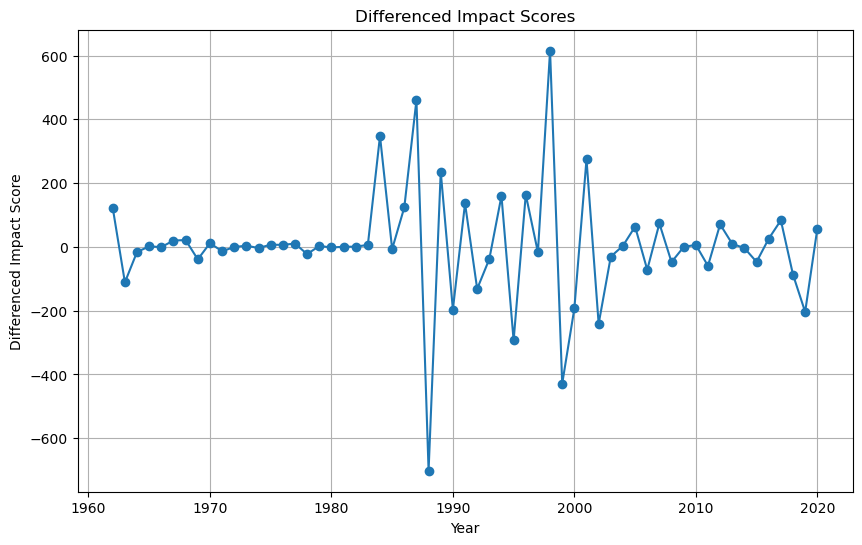

In [415]:
# Plot the differenced series
plt.figure(figsize=(10, 6))
plt.plot(diff_series, marker='o', linestyle='-')
plt.title('Differenced Impact Scores')
plt.xlabel('Year')
plt.ylabel('Differenced Impact Score')
plt.grid()
plt.show()

In [416]:
# Step 4: Fit the ARIMA model (adjust p, d, q as needed)
p = 2  
d = 1  # Differencing order
q = 2  

model = ARIMA(average_impact_per_year['impact_score'], order=(p, d, q))
model_fit = model.fit()

# Forecast future impact scores for 2025 to 2050
future_years = pd.date_range(start='2025', end='2051', freq='Y')
forecast_results = model_fit.get_forecast(steps=len(future_years))
forecast = forecast_results.predicted_mean
conf_int = forecast_results.conf_int()

# Prepare the forecast DataFrame
forecast_df = pd.DataFrame({
    'fire_year': future_years.year,
    'predicted_impact_score': forecast,
    'lower_bound': conf_int.iloc[:, 0],  # Lower bound of the confidence interval
    'upper_bound': conf_int.iloc[:, 1]   # Upper bound of the confidence interval
})
forecast_df.set_index('fire_year', inplace=True)

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA par

### Viewing historical data, predicitons for ARIMA model and Confidence interval

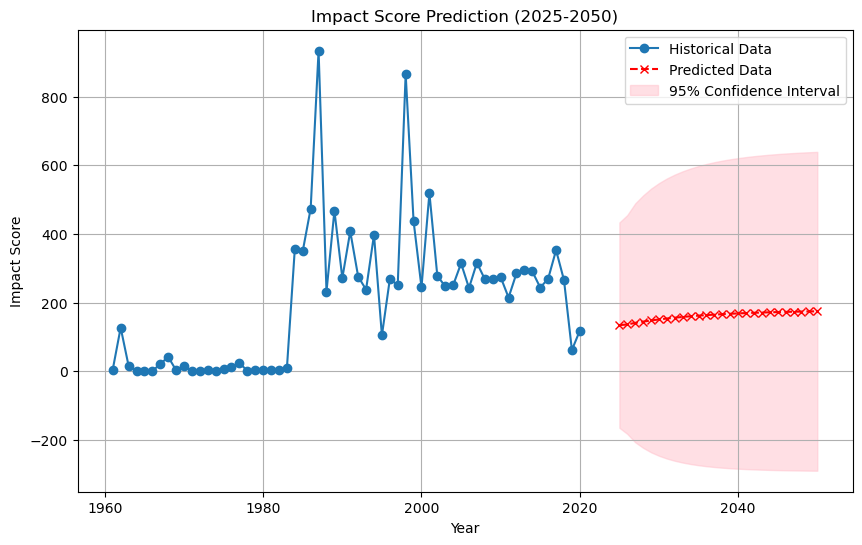

In [417]:
#plot the actual, forecasted and confidence interval values
plt.figure(figsize=(10, 6))
plt.plot(average_impact_per_year.index, average_impact_per_year['impact_score'], marker='o', linestyle='-', label='Historical Data')
plt.plot(forecast_df.index, forecast_df['predicted_impact_score'], marker='x', linestyle='--', color='red', label='Predicted Data')

# Plotting confidence intervals
plt.fill_between(forecast_df.index, 
                 forecast_df['lower_bound'], 
                 forecast_df['upper_bound'], 
                 color='pink', 
                 alpha=0.5, 
                 label='95% Confidence Interval')

plt.title('Impact Score Prediction (2025-2050)')
plt.xlabel('Year')
plt.ylabel('Impact Score')
plt.legend()
plt.grid()
plt.show()

## Checking correlation 

In [419]:
average_impact_per_year = average_impact_per_year.drop(columns=['diff'])

In [420]:
# Merge the DataFrames on the year
merged_df = avg_df.merge(average_impact_per_year, left_on='year', right_on='fire_year', how='inner')

# Calculate the correlation
correlation = merged_df['impact_score'].corr(merged_df['aqi'])

print("Correlation between impact score and AQI:", correlation)

Correlation between impact score and AQI: 0.35140928298878776



**A correlation of 0.35 indicates a moderate positive relationship between impact score and AQI, suggesting that higher fire smoke impact generally coincides with poorer air quality, though other factors also influence AQI.**

# Step 2: Visualize aspects of your analysis

## Produce a histogram showing the number of fires occurring every 50 mile distance from your assigned city for all fires ranging up to 1800 miles away from your assigned city. Your histogram should indicate the distance cut-off for your modeling work as specified in Step 1.


In [421]:
#get info on all fires and their distances form Charleston
all_fires_df = pd.DataFrame(all_fires)

/var/folders/4g/nhvf99_175n0b7w76qwfxrkc0000gn/T/ipykernel_51558/1998217582.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_fires.loc[:, 'distance_bin'] = pd.cut(filtered_fires['distance_miles'], bins)


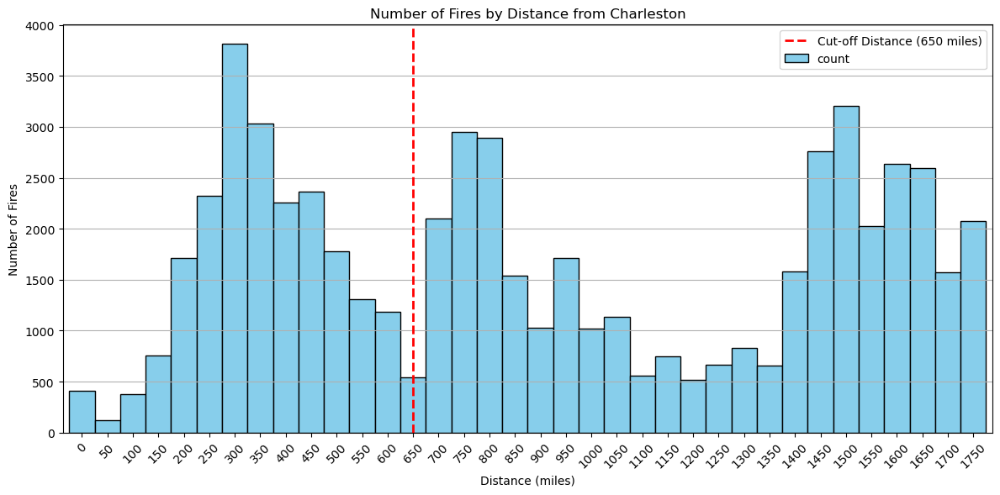

In [423]:
# Filter for fires up to 1800 miles away from Charleston
filtered_fires = all_fires_df[all_fires_df['distance_miles'] <= 1800]

# Create distance bins (0-1800 miles in 50-mile intervals)
bins = range(0, 1850, 50)  # Bins from 0 to 1800 with a step of 50

# Count the fires in each bin
filtered_fires.loc[:, 'distance_bin'] = pd.cut(filtered_fires['distance_miles'], bins)
fire_counts = filtered_fires['distance_bin'].value_counts().sort_index()

# Plot the histogram
plt.figure(figsize=(12, 6))
fire_counts.plot(kind='bar', color='skyblue', edgecolor='black', width=1.0)  # Set width to 1.0 for continuous bars

# Highlight the cut-off distance
plt.axvline(x=13, color='red', linestyle='--', label='Cut-off Distance (650 miles)', linewidth=2)

# Update x-tick labels
plt.xticks(ticks=range(len(fire_counts)), labels=[f"{int(interval.left)}" for interval in fire_counts.index], rotation=45)

plt.title('Number of Fires by Distance from Charleston')
plt.xlabel('Distance (miles)')
plt.ylabel('Number of Fires')
plt.legend()
plt.grid(axis='y')
plt.tight_layout()
plt.show()


## Produce a time series graph of total acres burned per year for the fires occurring in the specified distance from your city.

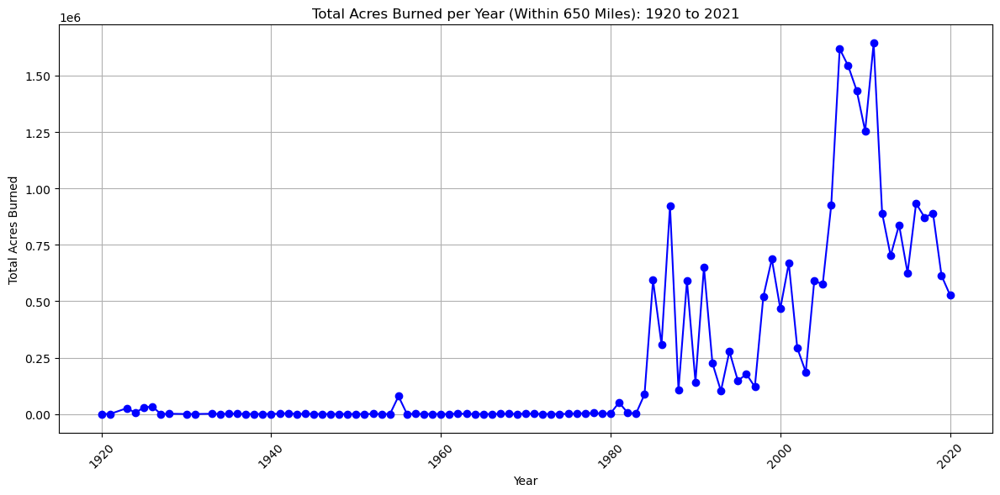

In [440]:
#Filter for fires within the specified distance (650 miles)
filtered_fires = all_fires_df[all_fires_df['distance_miles'] <= 650]

#Group by fire year and sum the fire sizes
total_acres_burned_per_year = filtered_fires.groupby('fire_year')['fire_size'].sum()

#Plot the time series graph
plt.figure(figsize=(12, 6))
total_acres_burned_per_year.plot(kind='line', marker='o', color='blue')

plt.title('Total Acres Burned per Year (Within 650 Miles): 1920 to 2021')
plt.xlabel('Year')
plt.ylabel('Total Acres Burned')
plt.grid()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

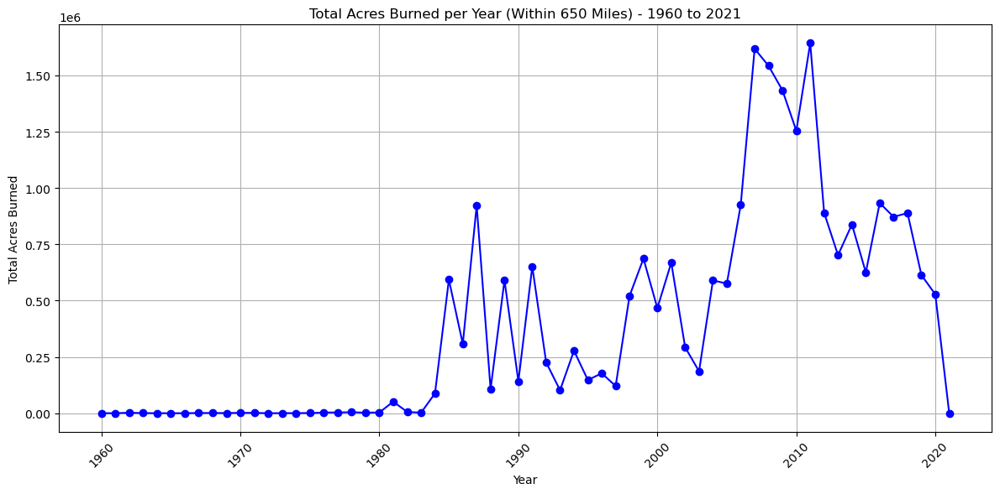

In [441]:
# Extend index to include all years from 1960 to 2020
total_acres_burned_per_year = total_acres_burned_per_year.reindex(range(1960, 2022), fill_value=0)

# Plot the time series graph
plt.figure(figsize=(12, 6))
total_acres_burned_per_year.plot(kind='line', marker='o', color='blue')

plt.title('Total Acres Burned per Year (Within 650 Miles) - 1960 to 2021')
plt.xlabel('Year')
plt.ylabel('Total Acres Burned')
plt.grid()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Produce a time series graph containing your fire smoke estimates for your city and the AQI estimates for your city.

In [447]:
#merge aqi and smoke estimate dataframes
merged_df = avg_df.merge(average_impact_per_year, left_on='year', right_on='fire_year', how='outer')

Since AQI data is avialble from 1999, there is no graph shown for AQI data before 1999.

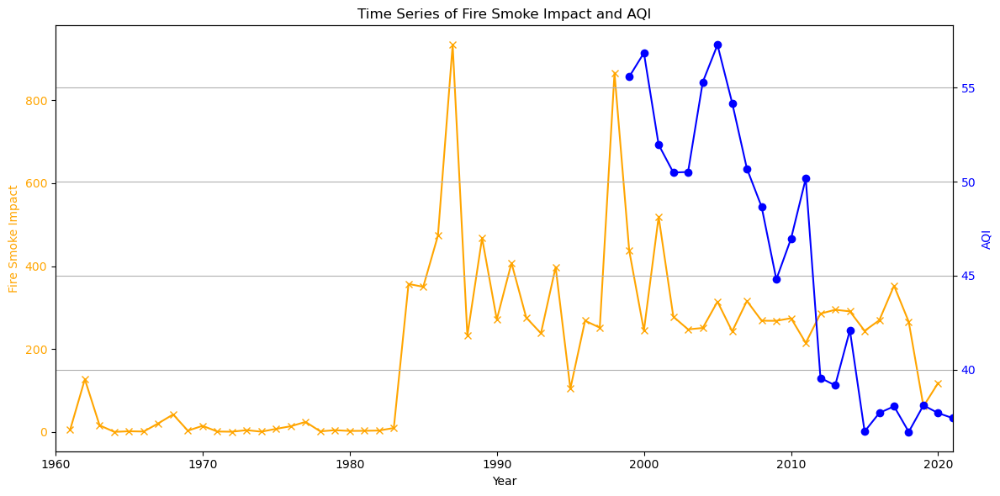

In [452]:
merged_df = merged_df.reset_index(drop=True)  # Ensure clean indexing
merged_df['year'] = range(1961, 1961 + len(merged_df))

# Define figure and axis for the plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot Fire Smoke Impact on the left y-axis
ax1.plot(merged_df['year'], merged_df['impact_score'], color='orange', marker='x', label='Fire Smoke Impact')
ax1.set_ylabel('Fire Smoke Impact', color='orange')
ax1.tick_params(axis='y', labelcolor='orange')

# Create a secondary y-axis for AQI
ax2 = ax1.twinx()
ax2.plot(merged_df['year'], merged_df['aqi'], color='blue', marker='o', label='AQI')
ax2.set_ylabel('AQI', color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

# Set the x-axis limits from 1960 to 2021
ax1.set_xlim([1960, 2021])

# Add title, labels, and grid
plt.title('Time Series of Fire Smoke Impact and AQI')
ax1.set_xlabel('Year')
plt.xticks(rotation=45)
plt.grid()
plt.tight_layout()

# Show the plot
plt.show()